<a href="https://colab.research.google.com/github/amanmeka/DataScience/blob/main/Unit7/AmanMekaU7proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install preliz
!pip install bambi

In [3]:
import numpy as np
import pandas as pd
import arviz as az
import matplotlib.pyplot as plt
import preliz as pz
import pymc as pm
import bambi as bmb
import seaborn as sns

In [4]:
import graphviz as gv

Your file on your github needs to be a a .ipynb file with the first four letters of one first name, the first four letters of one last name, and U6proj.

Ex1.

A student named Avy Aguacate Avocado Palta will submit a file named "Avy_AvocU7proj.ipynb", since she normally just goes by Avy, and, when pressed, reports Avocado as her last name. The " _ " after "Avy" serves as the fourth "letter" in her first name.

Ex2.

Army Armadillo will submit a file named "ArmyArmaU7proj.ipynb"

# Unit 7 Project: Polynomials, Splines, and GPs, Oh my!

**Task**:

Two parts:

1. Propose a data set that's compatible with pymc and/or bambi. I must approve your submission before you move on to part 2.

2. Create, analyze, and present any guassian process or approximate GP, degenerate or otherwise (this means glms and b splines are allowed), using pymc within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is), or if must be an actual GP
  - You must document and explain your model selection method. This means you must argue that your model choice (glm, b spline, GP) is better than at least one other choice. You may use either a theoretical or numerical argument.



Guidlines:

- Your data or your model type must be different from any project you've previously done.

- You are allowed to copy and paste any code from the notes, including my answer key (AK), without any reference or citations. Same goes for the course textbook, BAP3.

- This is an individual project. It is fine if you model the same process as a peer, but your raw data **must** be substantially different. "Substantially different" means that I, your instructor, arbitrarily think your data sets are different enough.

- Do not look at other student's code/jupyter notebooks. Copying, or copying and pasting, other students code will result in a failing grade. Also, I will tell all the other teachers I know that you cheated.

- If you want to know what another student did, ask them--any verbal communication about a project is allowed and encouraged. If you want to see a graphic they made, ask them to sketch a picture of it for you by hand.

- Any handwritten communication is also allowed and encouraged, so long as all parties are in the same physical location together. Example: you may sketch out a piece of code while verbally explaining to someone what you did. Do NOT: hand write the code for your entire project, take a picture, and send it to everyone in the course.

- If you use someone's code from outside this course (like from the internet, an AI, or your parent), you must ask me if it is ok, and you must cite them in your work. I don't care all they did was to click your space bar one more time: you tell me, and you cite their contribution. You don't need to tell me about or cite verbal or handwritten communication though.

- You may use a more complicated model--like something from further along in the course--IF I give you permission.

- If you are unsure whether or not something is ok or allowed: ASK BEFORE YOU DO IT.

Faliure to adhere to these guidlines will result in a failing grade.

Tips:

- Try to pick something that you care about, have knowledge of, experience with, or that you find interesting/cool.

- Gather data *before* picking a model or likelihood.

-  Use your best idea now; maybe you can look at the context you used in the previous project, and gather different data from it.

- Choose a data set with lots of columns, and lots of potential interactions between variables. It'll be more fun, and will make model/variable selection more relevant.

- This is not a competition to come up with the fanciest model structure. Find a data set that interests you, and apply the simplest model that captures the patterns in the data.

- Comment heavily, and explain your steps and thought process with text blocks. This is not only requried, it'll also help you understand what you're doing and what you want to do.

- I actually encourge you to use b splines; they work quite well, and trying to determine the location of the knots requires careful thought about the context of the data.

- Its ok to pick a data set for which you don't qute understand the context--so long as you think the context is cool.


In [6]:
link = "https://raw.githubusercontent.com/amanmeka/DataScience/refs/heads/main/datasci%20analysis%20-%20salary%20nba.csv"
bball = pd.read_csv(link)

In [50]:
# Prepare a unified DataFrame by renaming columns and handling NaNs consistently
bball_processed = bball.rename(columns={
    '2P': 'TwoP',
    '2PA': 'TwoPA',
    '3P': 'ThreeP',
    '3PA': 'ThreePA',
    'FG%': 'FG_percent',
    '2P%': 'TwoP_percent',
    '3P%': 'ThreeP_percent',
    'FT%': 'FT_percent'
})

# List of all columns used across all models (predictors and response)
all_relevant_columns = [
    'SALARY', 'Age', 'MP', 'FG', 'FGA', 'PTS', 'TwoP', 'TwoPA', 'ThreeP', 'ThreePA',
    'TRB', 'AST', 'STL', 'PF', 'FG_percent', 'FT_percent', 'TOV', 'FT', 'FTA'
]

# Drop rows with NaN values in any of these critical columns
bball_processed = bball_processed.dropna(subset=all_relevant_columns)

print(f"Shape of processed DataFrame after dropping NaNs: {bball_processed.shape}")

Shape of processed DataFrame after dropping NaNs: (588, 31)


In [10]:
bball

,Team,Player,Age,Pos,G,GS,MP,FG,FGA,FG%,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,SALARY
0,MIL,A.J. Green,25,SG,73,7,22.7,2.5,5.8,0.429,...,2.1,2.4,1.5,0.5,0.1,0.5,2.2,7.4,NaN,2120693
1,TOR,A.J. Lawson,24,SG,26,2,18.7,3.1,7.3,0.421,...,2.5,3.3,1.2,0.5,0.2,0.6,1.7,9.1,NaN,2120693
2,DEN,Aaron Gordon,29,PF,51,42,28.4,5.2,9.7,0.531,...,3.3,4.8,3.2,0.5,0.3,1.4,1.6,14.7,NaN,22841455
3,HOU,Aaron Holiday,28,PG,62,3,12.8,1.9,4.3,0.437,...,1.0,1.3,1.3,0.3,0.2,0.6,1.0,5.5,NaN,4668000
4,IND,Aaron Nesmith,25,SF,45,37,25.0,4.3,8.4,0.507,...,3.1,4.0,1.2,0.8,0.4,0.8,2.5,12.0,NaN,11000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,CHI,Zach LaVine,29,SF,42,42,34.1,8.6,16.9,0.511,...,4.5,4.8,4.5,0.9,0.2,2.9,1.5,24.0,NaN,44531940
597,SAC,Zach LaVine,29,SG,32,32,36.6,8.2,16.0,0.511,...,3.2,3.5,3.8,0.6,0.1,2.7,1.8,22.4,NaN,44531940
598,DEN,Zeke Nnaji,24,PF,57,4,10.7,1.2,2.5,0.496,...,1.0,1.6,0.4,0.4,0.7,0.2,1.1,3.2,NaN,8888889
599,BRK,Ziaire Williams,23,SF,63,45,24.5,3.4,8.3,0.412,...,3.6,4.6,1.3,1.0,0.4,1.1,2.4,10.0,NaN,6133005


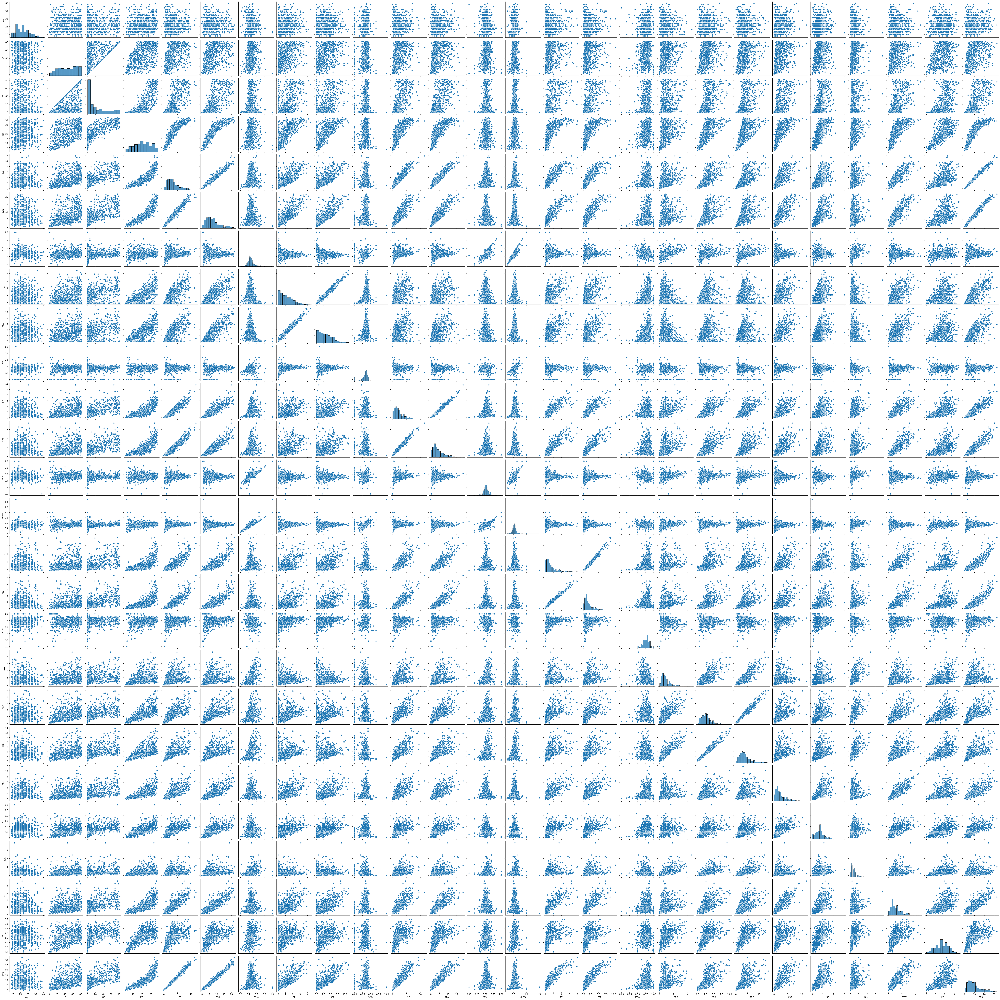

In [31]:
sns.pairplot(bball)

Because I want to predict salary, I will make it a little easier to view the trends.

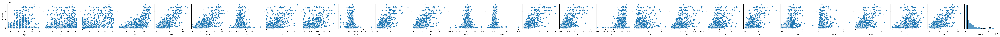

In [11]:
sns.pairplot(bball, y_vars=['SALARY'])
plt.show()


Notable Trends:
* Age
  - I think that age actually plays a much bigger role than you might think because an NBA player's salary increases with experience. younger players obviously have relatively less experience, which is why they get paid less even though they play at the same level as other players.
* MP
  - The more minutes you play, the more valuable you are to the team, which also means that you are probably paid relatively more
* FG/FGA/FG%
  - If you are taking and making more shots then you are probably a much more vital player to the team as most offense flows through you. This means you are paid more. This covers 2P and 3P.
* 2P/2PA/2P%
* 3P/3PA/3P%
* FT/FTA/FT%
* TRB
  - The more you are getting rebounds, the more likely you are to be paid more because rebounding is a vital part of hte game.
* AST
  - Assists are just as important as made shots because passing the ball to a player with a good look is a hard skill to learn. Therefore you are probably paid more if you assist more.
* STL
  - The more steals, the more you get paid. This one is not that strong of a trend.
* TOV (not as it might seem though)
  - Although it might seem like the more turnovers you have the less you play, that is not the case. It is unfair to say that more turnovers = less pay because if you have the ball more then you are more likely to have more turnovers. That doesn't necessarily mean that you are a worse player.
* PF (also a tricky one)
  - This one is tricky because everyone on the court fouls, and it has almost nothing to do with skill or salary. But if you have more fouls, then you are probably on the court more so that very indirectly means that you are a big part of the game. Most people that foul out of games are good players that are vital to the defense of a team.
* PTS
  - This one goes without saying, the more points you get, the more you get paid. Although this one also gives a bit of an illusion too.

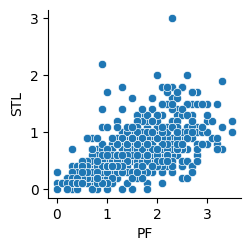

In [32]:
sns.pairplot(bball, y_vars=['STL'], x_vars=['PF'])
plt.show()

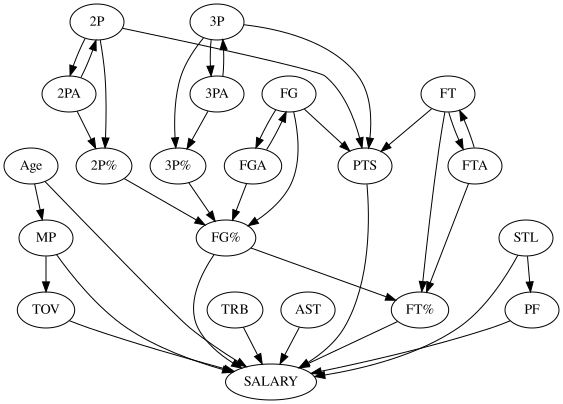

In [34]:
#multiple predictor causal diagram
dag_b = gv.Digraph() #b for bikes

dag_b.node('A', 'Age')
dag_b.node('B', 'MP')

dag_b.node('C', 'FG')
dag_b.node('D', 'FGA')
dag_b.node('E', 'FG%')

dag_b.node('F', '2P')
dag_b.node('G', '2PA')
dag_b.node('H', '2P%')

dag_b.node('I', '3P')
dag_b.node('J', '3PA')
dag_b.node('K', '3P%')

dag_b.node('L', 'FT')
dag_b.node('M', 'FTA')
dag_b.node('N', 'FT%')

dag_b.node('O', 'TRB')
dag_b.node('P', 'AST')
dag_b.node('Q', 'STL')
dag_b.node('R', 'TOV')
dag_b.node('S', 'PF')
dag_b.node('T', 'PTS')
dag_b.node('Z', 'SALARY')


dag_b.edges(['AZ', 'AB', 'BZ', 'DC', 'CD', 'CE', 'DE', 'GF', 'FG', 'FH', 'GH', 'JI', 'IJ', 'IK', 'JK', 'LM', 'ML', 'LN', 'MN', 'OZ', 'PZ', 'QZ', 'RZ', 'SZ', 'TZ', 'EN', 'HE', 'KE', 'EZ', 'NZ', 'CT', 'FT', 'IT', 'LT', 'BR', 'QS'])

dag_b

I could have added a lot more interactions between each element in this DAG but I felt like this was a good representation. I also didn't want to overcomplicate things.

## Model 1

In [ ]:
# have to do this bc can't put numbers in poly
# Using the pre-processed bball_processed DataFrame
# The renaming of bball_poly1 is no longer needed as it's done in bball_processed
model_poly1 = bmb.Model("SALARY ~ poly(TwoP, degree=2) + poly(TwoPA, degree=2) + poly(ThreeP, degree=2) + poly(ThreePA, degree=2) + poly(FG, degree=2) + poly(FGA, degree=2) + poly(PTS, degree=2) + poly(MP, degree=2) + poly(Age, degree=2)", bball_processed, family="gaussian") # Use bball_processed
idata_poly1 = model_poly1.fit(idata_kwargs={"log_likelihood": True})

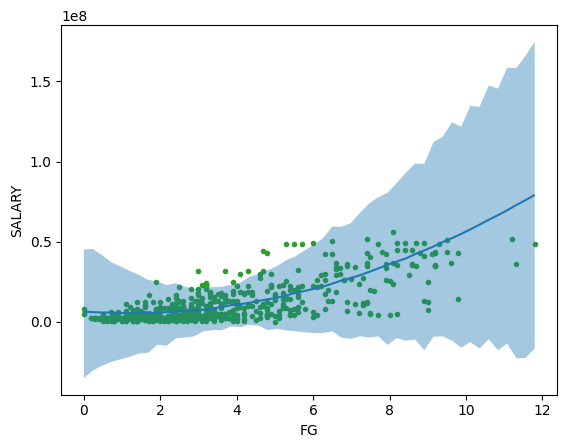

In [32]:
bmb.interpret.plot_predictions(model_poly1, idata_poly1, "FG", pps=True)
plt.plot(bball.FG, bball.SALARY, "C2.", zorder=-3);

This looks like it fits the curve pretty well, with just the poly function. i dont get why it tapers at the edge of the graph though.

## Model 2

In [ ]:
num_knots = 4
# Calculate knots using the processed DataFrame
knots_fga = np.linspace(bball_processed.FGA.min(), bball_processed.FGA.max(), num_knots+2)[1:-1]
knots_trb = np.linspace(bball_processed.TRB.min(), bball_processed.TRB.max(), num_knots+2)[1:-1]
knots_ast = np.linspace(bball_processed.AST.min(), bball_processed.AST.max(), num_knots+2)[1:-1]
knots_stl = np.linspace(bball_processed.STL.min(), bball_processed.STL.max(), num_knots+2)[1:-1]
knots_pf = np.linspace(bball_processed.PF.min(), bball_processed.PF.max(), num_knots+2)[1:-1]
knots_mp = np.linspace(bball_processed.MP.min(), bball_processed.MP.max(), num_knots+2)[1:-1]
knots_age = np.linspace(bball_processed.Age.min(), bball_processed.Age.max(), num_knots+2)[1:-1]

model_spline = bmb.Model("SALARY ~ bs(FGA, degree=3, knots=knots_fga) + bs(TRB, degree=3, knots=knots_trb) + bs(AST, degree=3, knots=knots_ast) + bs(STL, degree=3, knots=knots_stl) + bs(PF, degree=3, knots=knots_pf) + bs(MP, degree=3, knots=knots_mp) + bs(Age, degree=3, knots=knots_age)", bball_processed, family="gaussian") # Use bball_processed
idata_spline = model_spline.fit(idata_kwargs={"log_likelihood":True})

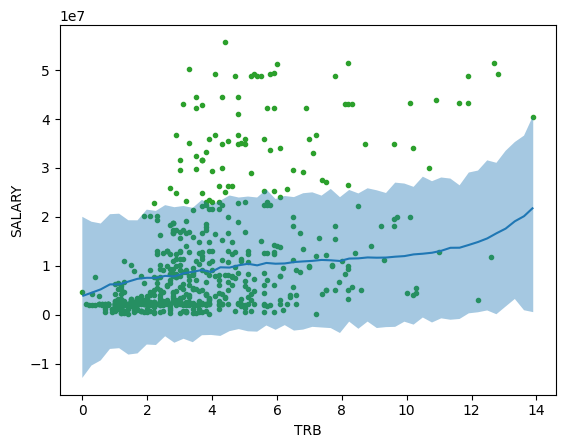

In [42]:
bmb.interpret.plot_predictions(model_spline, idata_spline, "TRB", pps= True)
plt.plot(bball.TRB, bball.SALARY, "C2.", zorder=-3);

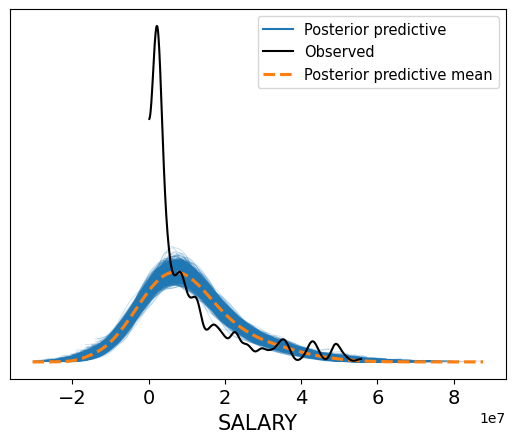

In [43]:
model_spline.predict(idata_spline, kind="response")
az.plot_ppc(idata_spline);

there is a spike at the end but other than that I think that this fit it okay.

## Model 3

In [ ]:
# have to do this bc can't put numbers in poly
# Using the pre-processed bball_processed DataFrame
# The renaming of bball_poly2 is no longer needed, and dropna=True is not necessary here
predictors = [
    'Age', 'MP', 'FG_percent', 'FT_percent', 'TRB', 'AST', 'STL', 'TOV', 'PF', 'PTS',
    'TwoP', 'TwoPA', 'ThreeP', 'ThreePA', 'FG', 'FGA', 'FT', 'FTA'
]

# this for loop with the help of gemini (thank you)
formula_parts = []
for p in predictors:
    formula_parts.append(f"poly({p}, degree=2)")

formula = "SALARY ~ " + " + ".join(formula_parts)

model_poly2 = bmb.Model(formula, bball_processed, family="gaussian") # Use bball_processed
idata_poly2 = model_poly2.fit(idata_kwargs={"log_likelihood": True})

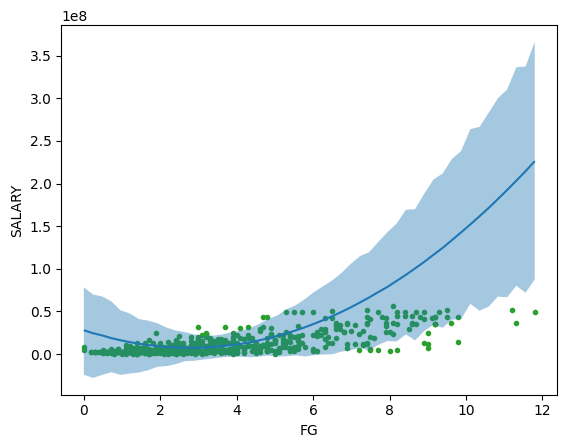

In [49]:
bmb.interpret.plot_predictions(model_poly2, idata_poly2, "FG", pps=True)
plt.plot(bball.FG, bball.SALARY, "C2.", zorder=-3);

## Conclusion

In [ ]:
cmp_df = az.compare({"model 1":idata_poly1,
                     "model 2":idata_spline,
                     "model 3":idata_poly2,
                     })

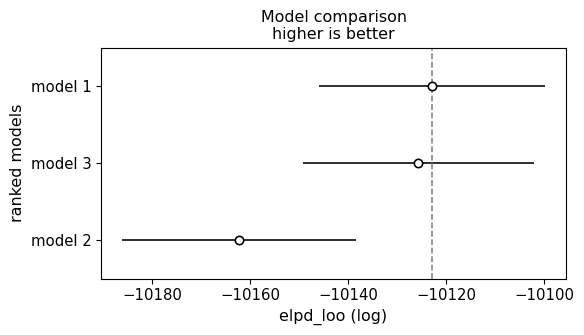

In [55]:
az.plot_compare(cmp_df);